# Notebook demonstrating the use of Timeseriesai for generating predictions
https://github.com/timeseriesAI/timeseriesAI

## The below is done using the tutorial data set (one state, one season) and is a very small dataset so the results are only intended for use on how to use this, not necessarily what the ML capability is

### uses env timeseriesai

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from tsai.all import *
from joblib import Parallel, delayed
from openavalancheproject.tsai_utilities import *
import zarr
from fastai.callback.tracker import EarlyStoppingCallback


In [3]:
#chck if GPU is available
torch.cuda.device(0)
torch.cuda.is_available()

True

In [4]:
data_root = 'D:/OAPMLData/'

ml_path = data_root + '/4.MLData/'
interpolation = 1
label = 'Day1DangerAboveTreeline'
file_label = 'co_day1above_3h_tutorial'

In [5]:
#load the full X datafile which has both Train and Test concated
X = zarr.open(ml_path + 'X_' + file_label + '.zarr', mode='r')

In [6]:
X.shape

(500, 981, 1441)

In [7]:
#initialize the utilities class
utils = TSAIUtilities(X, label)

In [8]:
feature_names = pd.read_csv(ml_path + '/FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [9]:
#filter down the features to a smaller subset which are more relevant
filtered_feature_list = utils.filter_features(set(feature_names), only_var=False)
print(len(filtered_feature_list))

95


In [10]:
#get those features indexes
filtered_feature_indexes = [list(feature_names).index(x) for x in filtered_feature_list]

In [11]:
#filter down the X data to only those features
#also filter down to only the last 84 days of data
X_small_84 = X.get_orthogonal_selection((slice(None), filtered_feature_indexes, slice(1442-8*84, 1441)))

In [12]:
X_small_84.shape #(samples, features, timesteps)

(500, 95, 671)

In [13]:
#read in the corresponding label files and concat them
#can get the right values here based on the contents of the ml_path directory

num_train_files = 4
file_list = []
for i in range(num_train_files):
    file_list.append(pd.read_parquet(ml_path + '/y_train_batch_' + str(i) + '_' + file_label + '.parquet'))

    
num_test_files = 1
for i in range(num_test_files):
    file_list.append(pd.read_parquet(ml_path + '/y_test_batch_' + str(i + num_train_files) + '_' + file_label + '.parquet'))
    
y_df = pd.concat(file_list).reset_index(drop=True)

In [14]:
y_df['Day1DangerAboveTreeline'].value_counts()

Day1DangerAboveTreeline
Low             148
Moderate        143
Considerable    117
High             92
Name: count, dtype: int64

In [15]:
y, cat_dict = utils.get_y_as_cat(y_df)
cat_dict

{0: 'Low', 1: 'Moderate', 2: 'Considerable', 3: 'High'}

In [16]:
#last 100 days are test
splits = (L(range(0,400)).shuffle(), L(range(400,500)).shuffle())


In [17]:
#calculate the min and maxes so we can normalize the data
feature_mins, feature_maxs = utils.calc_min_max(X_small_84, 0, 400)

on 0
on 10
on 20
on 30
on 40
on 50
on 60
on 70
on 80
on 90


In [18]:
feature_mins_test, feature_maxs_test = utils.calc_min_max(X_small_84, 400, X.shape[0])

on 0
on 10
on 20
on 30
on 40
on 50
on 60
on 70
on 80
on 90


In [19]:
X = X_small_84

In [20]:
splits, dls = utils.create_dls(X_small_84, y, feature_mins=np.array(feature_mins), feature_maxs=np.array(feature_maxs), sample_frac=1, splits=splits)
splits

((#400) [358,349,63,227,375,75,133,370,300,383...],
 (#100) [495,449,431,403,464,446,437,468,435,421...])

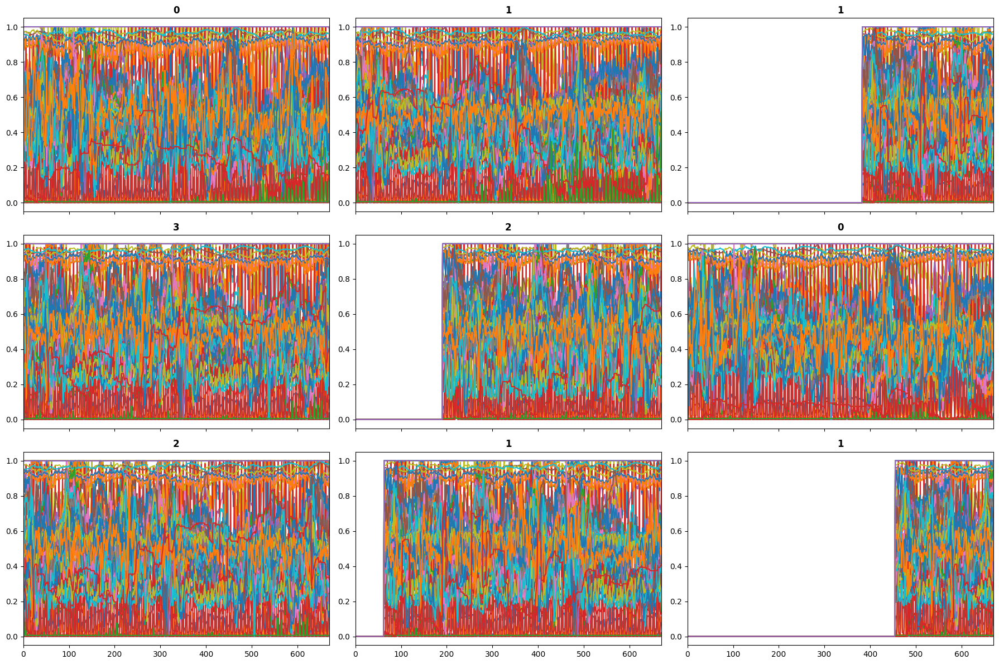

In [21]:
#check the data from the dataloader to ensure its normalized correctly
dls.show_batch()

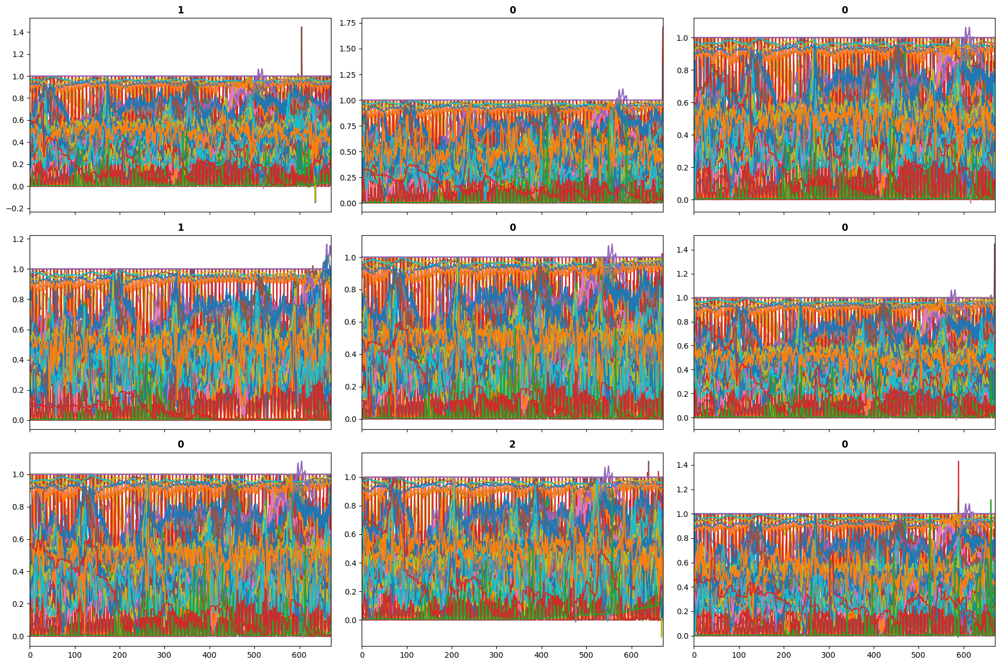

In [22]:
#since normalization values (min/max) are just set on our small training set some of these values might be outside the range
#a larger and more representative training set would improve this
dls.valid.show_batch()

# Lets try and train a model, in the tutorial case we are using an extremely small dataset so no conclusions should be drawn from these results they are for illustrative purposes only

In [29]:
model = TSTPlus(dls.vars, dls.c, dls.len, d_ff=256, d_k=32, d_model=128, d_v=32, dropout=.7, fc_dropout=.1, n_heads=16, n_layers=3)
learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[accuracy, BalancedAccuracy()],  cbs=[ShowGraphCallback2(), PredictionDynamics()])

SuggestedLRs(valley=5.248074739938602e-05)

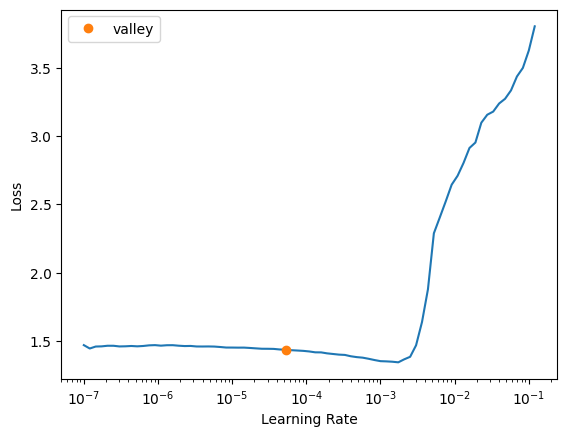

In [25]:
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.461693,1.344478,0.420000,0.325405,00:02
1,1.444226,1.341888,0.420000,0.318182,00:02
2,1.419731,1.338226,0.440000,0.333333,00:02
3,1.407508,1.326143,0.440000,0.333333,00:02
4,1.382182,1.313726,0.430000,0.326286,00:02
5,1.344388,1.288548,0.480000,0.365046,00:02
6,1.315316,1.299669,0.540000,0.414376,00:02
7,1.283139,1.260546,0.520000,0.397992,00:02
8,1.250509,1.238437,0.490000,0.374560,00:02
9,1.217575,1.235109,0.510000,0.391121,00:02


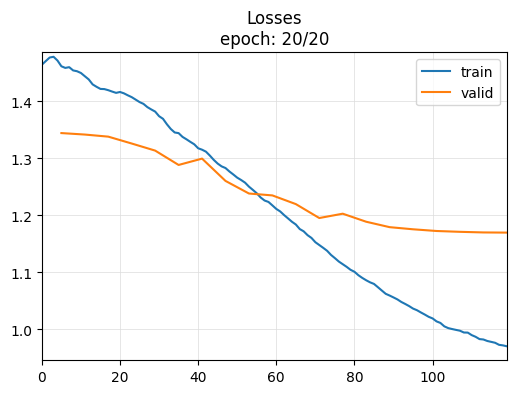

,train_loss,valid_loss,accuracy,balanced_accuracy_score
19,0.970384,1.169834,0.52,0.396054


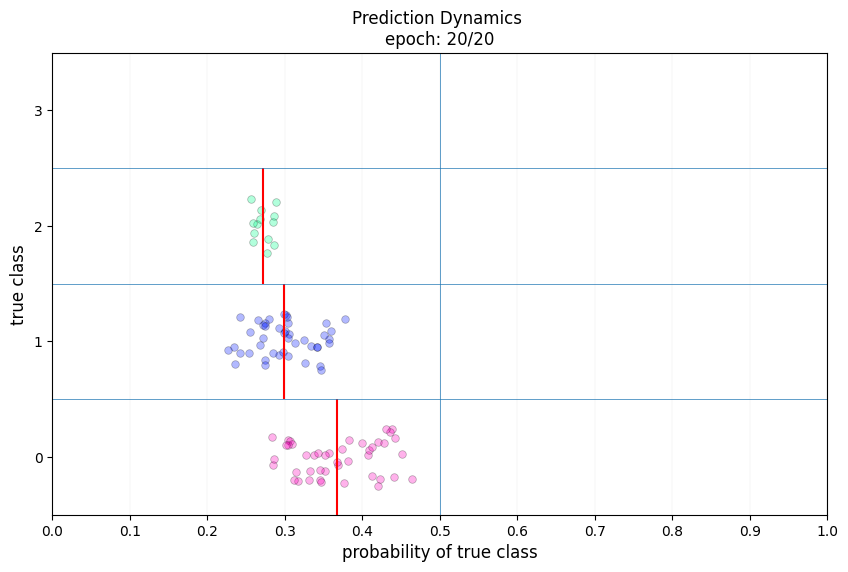

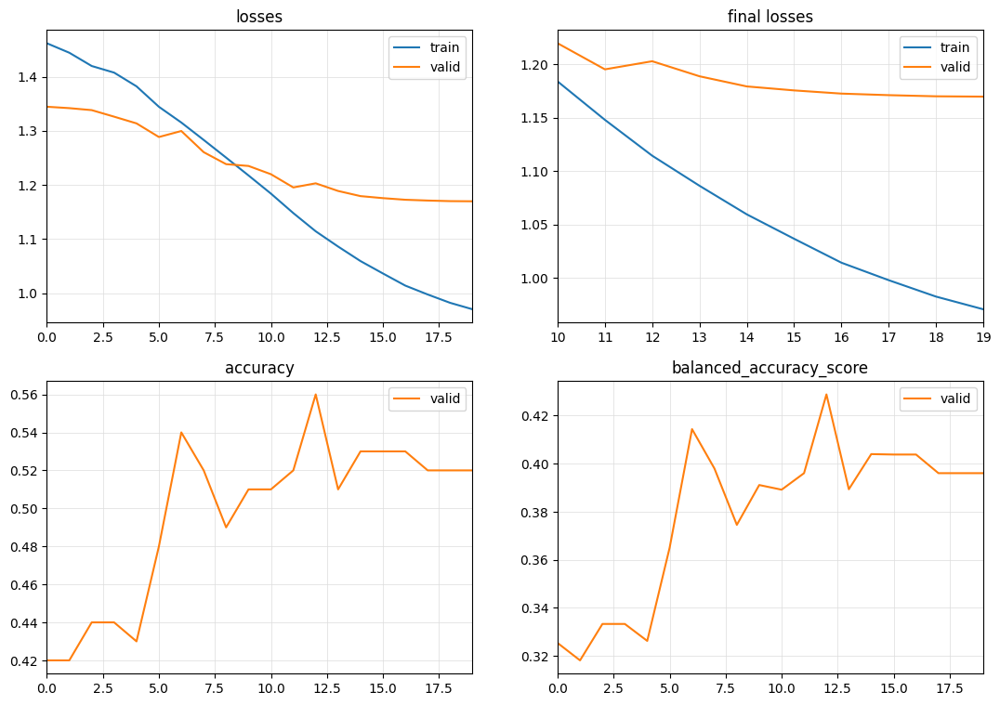

In [30]:
learn.fit_one_cycle(20, 1e-4)

## Below is with a much larger and more representative training set
### Current results represnt state of the art for this project at 51.3205% Balanced Accuracy

In [5]:
file_label = 'ca_co_day1above_3h_14d_small'
X = zarr.open(ml_path + 'X_' + file_label + '.zarr', mode='r')

In [6]:
X.shape

(480000, 82, 113)

In [7]:

utils = TSAIUtilities(X, label)
feature_names = pd.read_csv(ml_path + '/FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [8]:
feature_names

array(['ACPCP_surface_sum', 'APCP_surface_sum', 'APTMP_2maboveground_avg',
       'CAPE_180M0mbaboveground_avg', 'CAPE_255M0mbaboveground_avg',
       'CAPE_surface_avg', 'CIN_180M0mbaboveground_avg',
       'CIN_255M0mbaboveground_avg', 'CIN_surface_avg',
       'GUST_surface_avg', 'RH_100mb_avg', 'RH_2maboveground_avg',
       'RH_300mb_avg', 'RH_30M0mbaboveground_avg', 'RH_700mb_avg',
       'SNOD_surface_avg', 'TMP_100maboveground_avg', 'TMP_150mb_avg',
       'TMP_2maboveground_avg', 'TMP_30M0mbaboveground_avg',
       'TMP_600mb_avg', 'TMP_80maboveground_avg', 'TMP_925mb_avg',
       'TMP_surface_avg', 'UGRD_0D995sigmalevel_avg', 'UGRD_1000mb_avg',
       'UGRD_100mb_avg', 'UGRD_10mb_avg', 'UGRD_150mb_avg',
       'UGRD_200mb_avg', 'UGRD_20mb_avg', 'UGRD_250mb_avg',
       'UGRD_300mb_avg', 'UGRD_30mb_avg', 'UGRD_350mb_avg',
       'UGRD_400mb_avg', 'UGRD_450mb_avg', 'UGRD_500mb_avg',
       'UGRD_50mb_avg', 'UGRD_550mb_avg', 'UGRD_600mb_avg',
       'UGRD_650mb_avg', 'UGRD_700mb

In [9]:
num_train_files = 200 
file_list = []
for i in range(num_train_files):
    file_list.append(pd.read_parquet(ml_path + '/y_train_batch_' + str(i) + '_' + file_label + '.parquet'))

    
num_test_files = 40 
for i in range(num_test_files):
    file_list.append(pd.read_parquet(ml_path + '/y_test_batch_' + str(i + num_train_files) + '_' + file_label + '.parquet'))
    
y_df = pd.concat(file_list).reset_index(drop=True)

In [10]:
y_df['Day1DangerAboveTreeline'].value_counts()

Day1DangerAboveTreeline
High            121282
Considerable    121282
Moderate        121252
Low             116184
Name: count, dtype: int64

In [11]:
y, cat_dict = utils.get_y_as_cat(y_df)
cat_dict

{0: 'Low', 1: 'Moderate', 2: 'Considerable', 3: 'High'}

In [12]:
train_test_seperator = len(y_df[y_df['season'] != '20-21'])

In [13]:
splits = (L(range(0,train_test_seperator)).shuffle(), L(range(train_test_seperator,len(y_df))).shuffle())

In [20]:
feature_mins, feature_maxs = utils.calc_min_max(X, 0, train_test_seperator)

on 0
on 10
on 20
on 30
on 40
on 50
on 60
on 70
on 80


In [21]:
#save feature_mins and feature_maxes to disk
np.save(ml_path + 'feature_mins_' + file_label + '.npy', feature_mins)
np.save(ml_path + 'feature_maxs_' + file_label + '.npy', feature_maxs)

In [14]:
#read feature_mins and feature_maxes from disk
feature_mins = np.load(ml_path + 'feature_mins_' + file_label + '.npy')
feature_maxs = np.load(ml_path + 'feature_maxs_' + file_label + '.npy')


In [15]:
splits2, dls = utils.create_dls(X, y, feature_mins=np.array(feature_mins), feature_maxs=np.array(feature_maxs), sample_frac=1.0, splits=splits, batch_size=96)
splits2

((#400000) [135471,261318,164429,152226,263600,77423,86784,66454,209435,263276...],
 (#80000) [426247,459680,406827,458924,453804,423636,458209,460819,478565,442533...])

In [16]:
model = TSTPlus(dls.vars, dls.c, seq_len=X.shape[2], d_model=27, n_heads=27, d_k=1, d_v=2, d_ff=128, dropout=.2, n_layers=16, fc_dropout=.8, attn_dropout=.4, store_attn=False)
learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropy(), metrics=[accuracy, BalancedAccuracy()],  opt_func=partial(Adam, decouple_wd=False),cbs=[ShowGraphCallback2(), PredictionDynamics()])

In [17]:
lr = 1e-5

epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.574472,1.366230,0.342875,0.364192,23:58
1,1.492520,1.294179,0.390700,0.414025,23:39
2,1.416816,1.244814,0.406575,0.429945,23:52
3,1.369041,1.224753,0.433675,0.454516,24:03
4,1.335119,1.219332,0.451325,0.471299,23:40
5,1.313781,1.207031,0.463125,0.480820,23:39
6,1.283565,1.200758,0.472975,0.490182,23:54
7,1.271312,1.189436,0.481625,0.498600,23:39
8,1.233697,1.170356,0.492725,0.507665,23:53
9,1.197937,1.150265,0.510037,0.523707,40:08


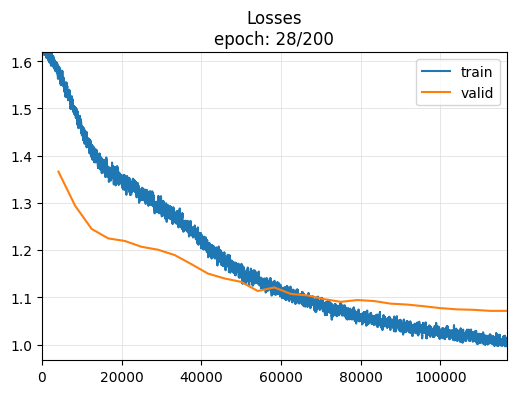

,train_loss,valid_loss,accuracy,balanced_accuracy_score
27,1.012588,1.071294,0.572163,0.582855


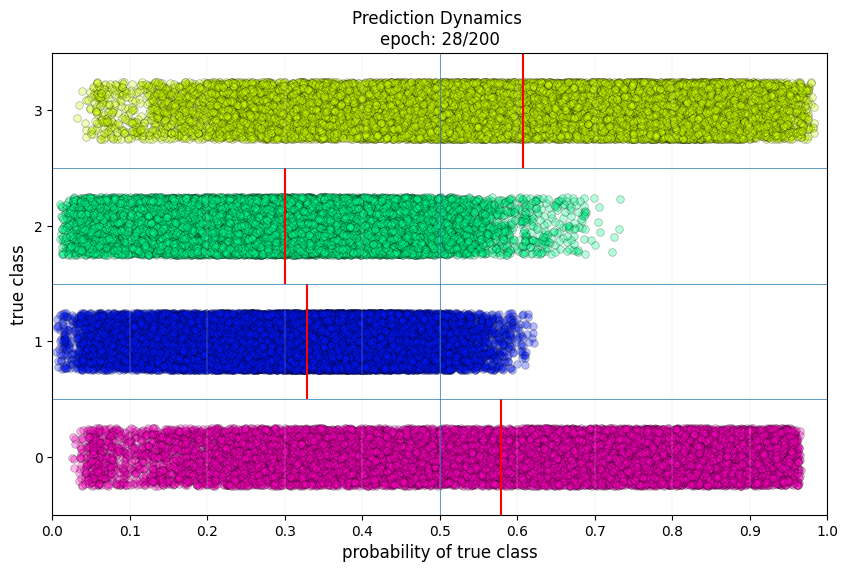

No improvement since epoch 23: early stopping


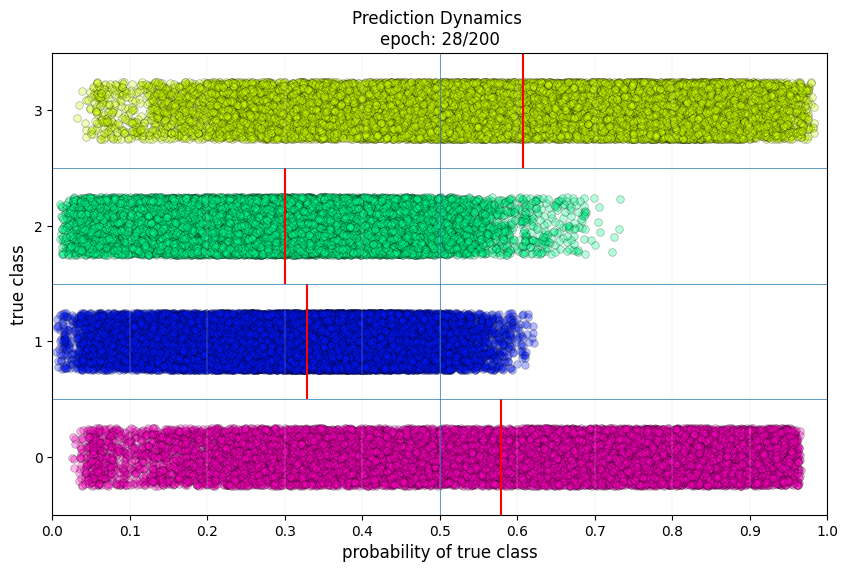

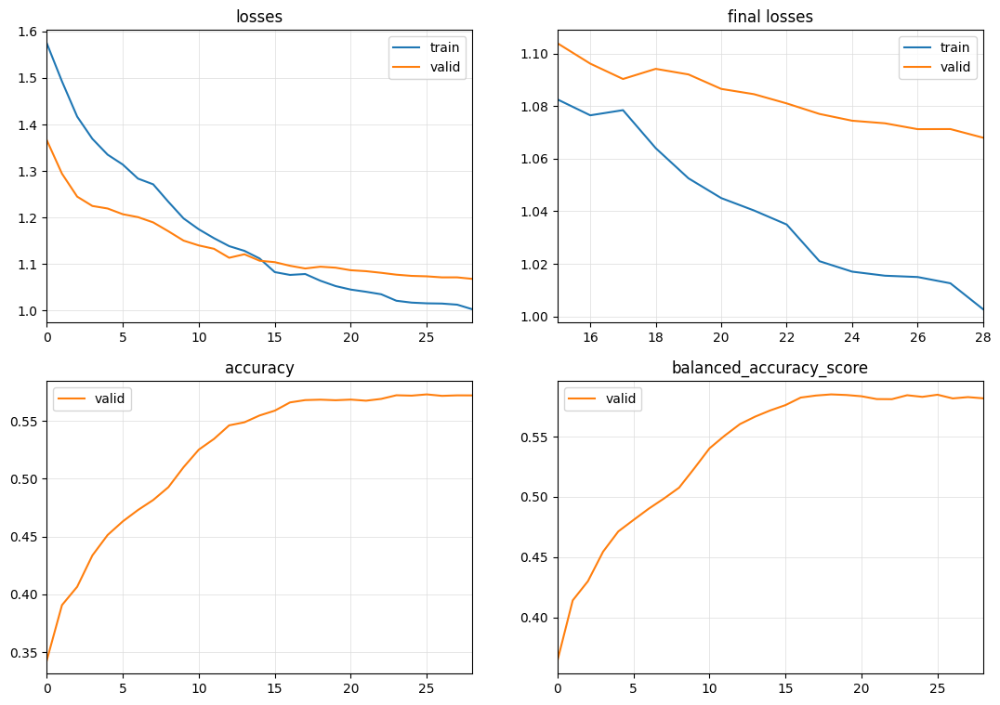

In [18]:
learn.fit_one_cycle(200, lr, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=5)])

### Results


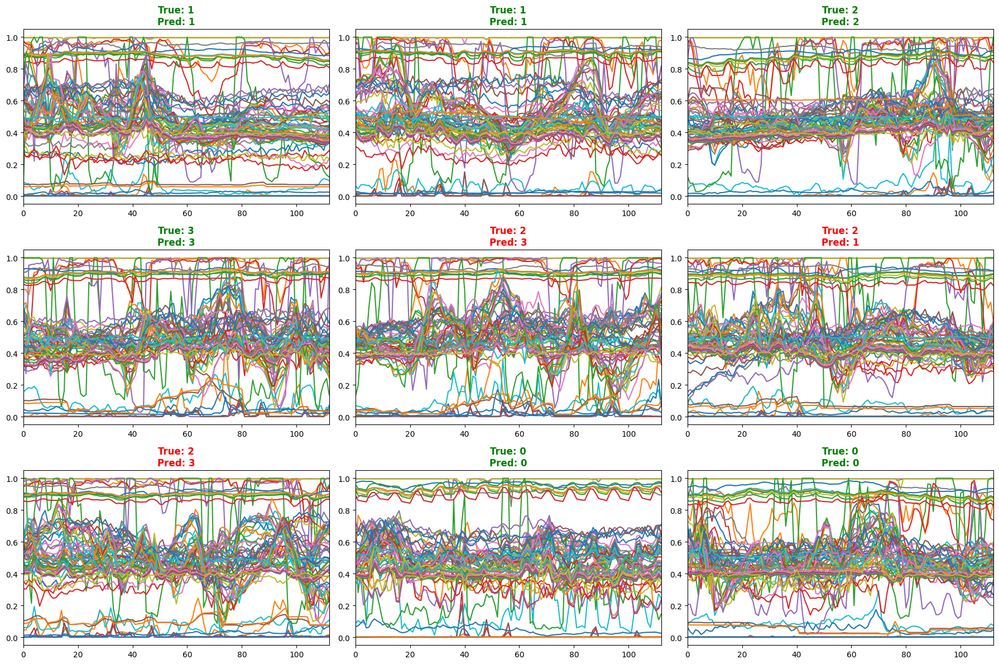

In [19]:
learn.show_results()

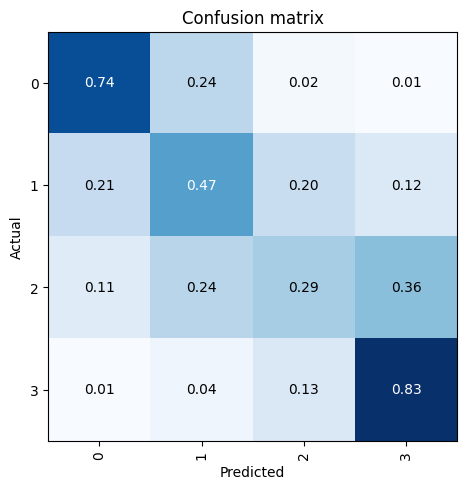

In [20]:
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

In [21]:
#print accuracy
interp.print_classification_report()

              precision    recall  f1-score   support

           0       0.63      0.74      0.68     16184
           1       0.50      0.47      0.49     21252
           2       0.46      0.29      0.36     21282
           3       0.63      0.83      0.72     21282

    accuracy                           0.57     80000
   macro avg       0.56      0.58      0.56     80000
weighted avg       0.55      0.57      0.55     80000



X.shape: (40000, 82, 113)
y.shape: (40000,)
Selected metric: accuracy
Computing feature importance (permutation method)...


  0 feature: BASELINE             accuracy: 0.645575


  0 feature: ACPCP_surface_sum    accuracy: 0.645475


  1 feature: APCP_surface_sum     accuracy: 0.644600


  2 feature: APTMP_2maboveground_avg accuracy: 0.643850


  3 feature: CAPE_180M0mbaboveground_avg accuracy: 0.645175


  4 feature: CAPE_255M0mbaboveground_avg accuracy: 0.645525


  5 feature: CAPE_surface_avg     accuracy: 0.645375


  6 feature: CIN_180M0mbaboveground_avg accuracy: 0.645450


  7 feature: CIN_255M0mbaboveground_avg accuracy: 0.645575


  8 feature: CIN_surface_avg      accuracy: 0.645325


  9 feature: GUST_surface_avg     accuracy: 0.641375


 10 feature: RH_100mb_avg         accuracy: 0.646450


 11 feature: RH_2maboveground_avg accuracy: 0.643175


 12 feature: RH_300mb_avg         accuracy: 0.638750


 13 feature: RH_30M0mbaboveground_avg accuracy: 0.643875


 14 feature: RH_700mb_avg         accuracy: 0.627175


 15 feature: SNOD_surface_avg     accuracy: 0.644675


 16 feature: TMP_100maboveground_avg accuracy: 0.646675


 17 feature: TMP_150mb_avg        accuracy: 0.644300


 18 feature: TMP_2maboveground_avg accuracy: 0.645775


 19 feature: TMP_30M0mbaboveground_avg accuracy: 0.645575


 20 feature: TMP_600mb_avg        accuracy: 0.645300


 21 feature: TMP_80maboveground_avg accuracy: 0.645175


 22 feature: TMP_925mb_avg        accuracy: 0.645925


 23 feature: TMP_surface_avg      accuracy: 0.645600


 24 feature: UGRD_0D995sigmalevel_avg accuracy: 0.645525


 25 feature: UGRD_1000mb_avg      accuracy: 0.645400


 26 feature: UGRD_100mb_avg       accuracy: 0.642225


 27 feature: UGRD_10mb_avg        accuracy: 0.631075


 28 feature: UGRD_150mb_avg       accuracy: 0.638875


 29 feature: UGRD_200mb_avg       accuracy: 0.644775


 30 feature: UGRD_20mb_avg        accuracy: 0.641400


 31 feature: UGRD_250mb_avg       accuracy: 0.634825


 32 feature: UGRD_300mb_avg       accuracy: 0.643475


 33 feature: UGRD_30mb_avg        accuracy: 0.637000


 34 feature: UGRD_350mb_avg       accuracy: 0.645075


 35 feature: UGRD_400mb_avg       accuracy: 0.642175


 36 feature: UGRD_450mb_avg       accuracy: 0.642600


 37 feature: UGRD_500mb_avg       accuracy: 0.642100


 38 feature: UGRD_50mb_avg        accuracy: 0.644050


 39 feature: UGRD_550mb_avg       accuracy: 0.645025


 40 feature: UGRD_600mb_avg       accuracy: 0.644350


 41 feature: UGRD_650mb_avg       accuracy: 0.643375


 42 feature: UGRD_700mb_avg       accuracy: 0.646800


 43 feature: UGRD_70mb_avg        accuracy: 0.623550


 44 feature: UGRD_750mb_avg       accuracy: 0.646775


 45 feature: UGRD_800mb_avg       accuracy: 0.645900


 46 feature: UGRD_850mb_avg       accuracy: 0.644175


 47 feature: UGRD_900mb_avg       accuracy: 0.645775


 48 feature: UGRD_925mb_avg       accuracy: 0.645375


 49 feature: UGRD_950mb_avg       accuracy: 0.644825


 50 feature: UGRD_975mb_avg       accuracy: 0.645075


 51 feature: VGRD_0D995sigmalevel_avg accuracy: 0.646225


 52 feature: VGRD_1000mb_avg      accuracy: 0.645300


 53 feature: VGRD_100mb_avg       accuracy: 0.626675


 54 feature: VGRD_10mb_avg        accuracy: 0.645250


 55 feature: VGRD_150mb_avg       accuracy: 0.642725


 56 feature: VGRD_200mb_avg       accuracy: 0.643975


 57 feature: VGRD_20mb_avg        accuracy: 0.640550


 58 feature: VGRD_250mb_avg       accuracy: 0.640200


 59 feature: VGRD_300mb_avg       accuracy: 0.642400


 60 feature: VGRD_30mb_avg        accuracy: 0.642975


 61 feature: VGRD_350mb_avg       accuracy: 0.646550


 62 feature: VGRD_400mb_avg       accuracy: 0.642525


 63 feature: VGRD_450mb_avg       accuracy: 0.644600


 64 feature: VGRD_500mb_avg       accuracy: 0.645000


 65 feature: VGRD_50mb_avg        accuracy: 0.643450


 66 feature: VGRD_550mb_avg       accuracy: 0.643575


 67 feature: VGRD_600mb_avg       accuracy: 0.645450


 68 feature: VGRD_650mb_avg       accuracy: 0.644100


 69 feature: VGRD_700mb_avg       accuracy: 0.645325


 70 feature: VGRD_70mb_avg        accuracy: 0.645925


 71 feature: VGRD_750mb_avg       accuracy: 0.647325


 72 feature: VGRD_800mb_avg       accuracy: 0.647750


 73 feature: VGRD_850mb_avg       accuracy: 0.645875


 74 feature: VGRD_900mb_avg       accuracy: 0.644875


 75 feature: VGRD_925mb_avg       accuracy: 0.645600


 76 feature: VGRD_950mb_avg       accuracy: 0.645000


 77 feature: VGRD_975mb_avg       accuracy: 0.645300


 78 feature: VVEL_450mb_avg       accuracy: 0.645200


 79 feature: VVEL_750mb_avg       accuracy: 0.645900


 80 feature: WATR_surface_sum     accuracy: 0.645175


 81 feature: WEASD_surface_avg    accuracy: 0.642550



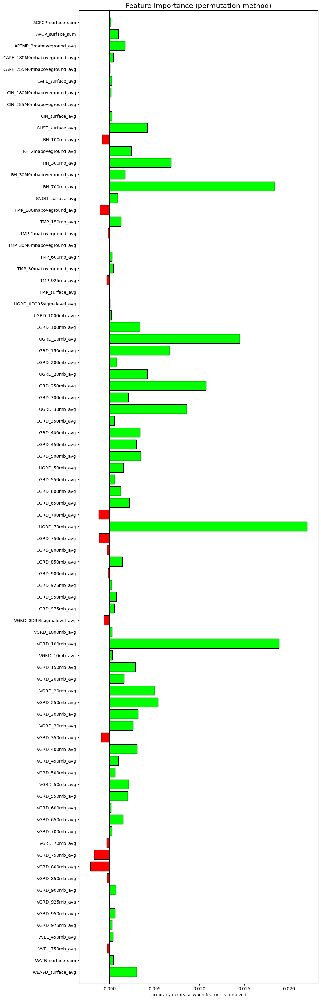

In [22]:
#list feature importances
fi = learn.feature_importance(partial_n=0.1, feature_names=list(feature_names))

In [24]:
#save the model
learn.export(ml_path + 'model_' + file_label + '20231029' + '.pkl')